# **Import Library**

In [ ]:
import cv2, fnmatch, os, random

import numpy as np, pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from tqdm import notebook
from tqdm.notebook import tqdm as tqdm

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

import tensorflow as tf

from keras.utils import to_categorical
from keras.callbacks import ReduceLROnPlateau
from keras_sequential_ascii import keras2ascii

from keras.applications import VGG16
from keras.models import Model, Sequential
from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense

# **Preprocessing Dataset**

## **Load Dataset**

### **Original Image**

In [ ]:
C = []
A = []

# label the image based on the type of batik
def assign_label(img, batik_type):
    return batik_type

# fetch images from a specified directory, label each image, and store them in lists C and A
def make_dataset(batik_type, DIR):
    for img in tqdm(os.listdir(DIR)):
        if fnmatch.fnmatch(img, '*.jpg'):
            label = assign_label(img, batik_type)
            path = os.path.join(DIR, img)
            img = cv2.imread(path)
            rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            C.append(rgb)
            A.append(str(label))

make_dataset('Angguran', "Batik Banyumasan/Angguran")
make_dataset('Ayam Puger', "Batik Banyumasan/Ayam Puger")
make_dataset('Jahe Lumbon', "Batik Banyumasan/Jahe Lumbon")
make_dataset('Jahe Puger', "Batik Banyumasan/Jahe Puger")
make_dataset('Jahe Srimpang', "Batik Banyumasan/Jahe Srimpang")
make_dataset('Lumbon', "Batik Banyumasan/Lumbon")
make_dataset('Madu Bronto', "Batik Banyumasan/Madu Bronto")
make_dataset('Pring Sedapur', "Batik Banyumasan/Pring Sedapur")
make_dataset('Puger Galar', "Batik Banyumasan/Puger Galar")
make_dataset('Puger Telu Bal', "Batik Banyumasan/Puger Telu Bal")
make_dataset('Wit Lumbon', "Batik Banyumasan/Wit Lumbon")

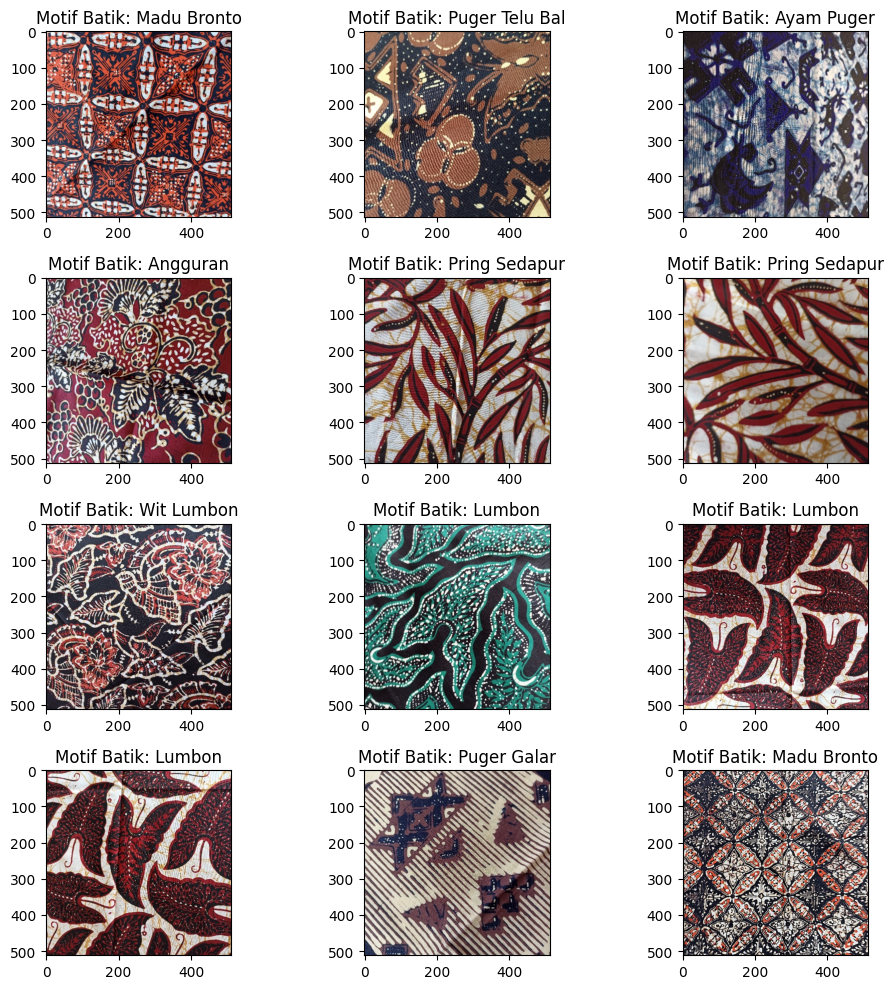

In [ ]:
fig, ax = plt.subplots(4, 3)
fig.set_size_inches(10, 10)

for i in range(4):  
    for j in range(3):  
        l = random.randint(0, len(A))  
        ax[i, j].imshow(C[l]) 
        ax[i, j].set_title('Motif Batik: ' + A[l])

plt.tight_layout()

### **Resize**

In [ ]:
C = [] 
R = [] 
IMG_SIZE = 128 

def assign_label(img, batik_type):
    return batik_type

def make_dataset(batik_type, DIR):
    for img in tqdm(os.listdir(DIR)): 
        if fnmatch.fnmatch(img, '*.jpg'):
            label = assign_label(img, batik_type)
            path = os.path.join(DIR, img)
            img = cv2.imread(path) 
            rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  
            resize = cv2.resize(rgb, (IMG_SIZE, IMG_SIZE)) 
            C.append(resize) 
            R.append(str(label)) 

make_dataset('Angguran', "Batik Banyumasan/Angguran")
make_dataset('Ayam Puger', "Batik Banyumasan/Ayam Puger")
make_dataset('Jahe Lumbon', "Batik Banyumasan/Jahe Lumbon")
make_dataset('Jahe Puger', "Batik Banyumasan/Jahe Puger")
make_dataset('Jahe Srimpang', "Batik Banyumasan/Jahe Srimpang")
make_dataset('Lumbon', "Batik Banyumasan/Lumbon")
make_dataset('Madu Bronto', "Batik Banyumasan/Madu Bronto")
make_dataset('Pring Sedapur', "Batik Banyumasan/Pring Sedapur")
make_dataset('Puger Galar', "Batik Banyumasan/Puger Galar")
make_dataset('Puger Telu Bal', "Batik Banyumasan/Puger Telu Bal")
make_dataset('Wit Lumbon', "Batik Banyumasan/Wit Lumbon")

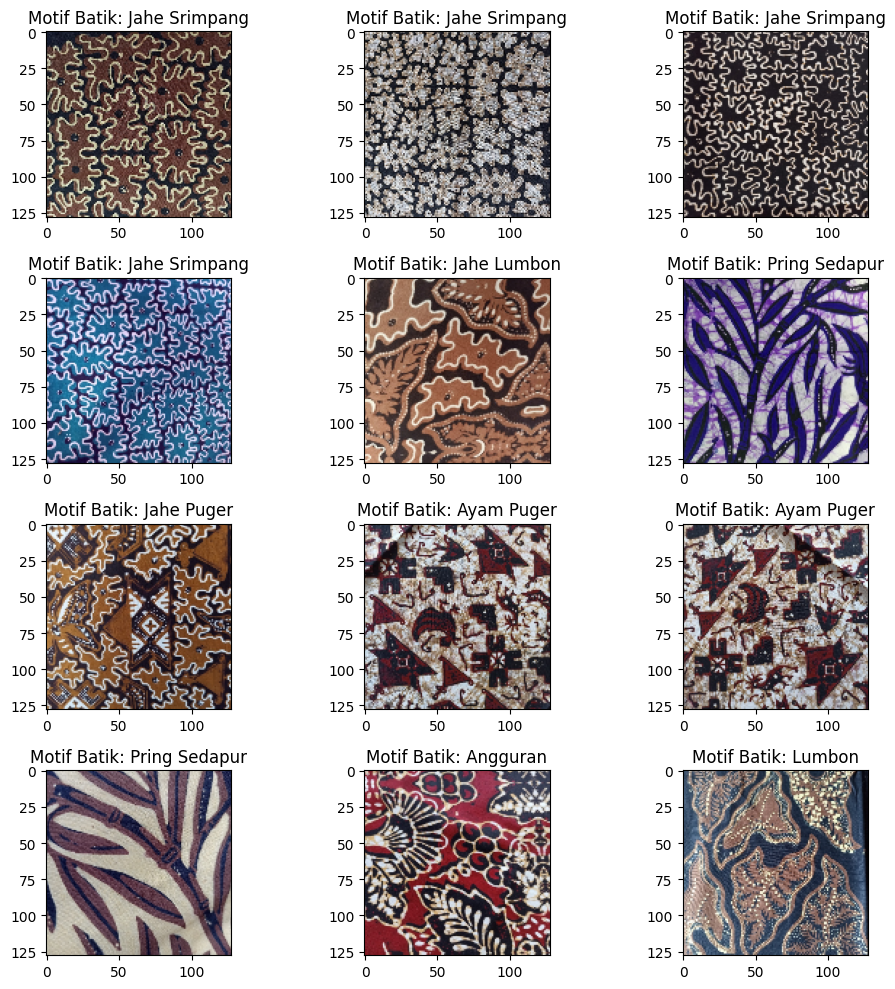

In [ ]:
fig, ax = plt.subplots(4, 3)
fig.set_size_inches(10, 10)

for i in range(4):  
    for j in range(3):  
        l = random.randint(0, len(R))  
        ax[i, j].imshow(C[l]) 
        ax[i, j].set_title('Motif Batik: ' + R[l]) 

plt.tight_layout()

### **Grayscale**

In [ ]:
C = [] 
G = [] 
IMG_SIZE = 128 

def assign_label(img, batik_type):
    return batik_type

def make_dataset(batik_type, DIR):
    for img in tqdm(os.listdir(DIR)):
        if fnmatch.fnmatch(img, '*.jpg'):
            label = assign_label(img, batik_type) 
            path = os.path.join(DIR, img)
            img = cv2.imread(path)
            rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            resize = cv2.resize(rgb, (IMG_SIZE, IMG_SIZE))
            gray = cv2.cvtColor(resize, cv2.COLOR_RGB2GRAY)
            C.append(gray)
            G.append(str(label))

make_dataset('Angguran', "Batik Banyumasan/Angguran")
make_dataset('Ayam Puger', "Batik Banyumasan/Ayam Puger")
make_dataset('Jahe Lumbon', "Batik Banyumasan/Jahe Lumbon")
make_dataset('Jahe Puger', "Batik Banyumasan/Jahe Puger")
make_dataset('Jahe Srimpang', "Batik Banyumasan/Jahe Srimpang")
make_dataset('Lumbon', "Batik Banyumasan/Lumbon")
make_dataset('Madu Bronto', "Batik Banyumasan/Madu Bronto")
make_dataset('Pring Sedapur', "Batik Banyumasan/Pring Sedapur")
make_dataset('Puger Galar', "Batik Banyumasan/Puger Galar")
make_dataset('Puger Telu Bal', "Batik Banyumasan/Puger Telu Bal")
make_dataset('Wit Lumbon', "Batik Banyumasan/Wit Lumbon")

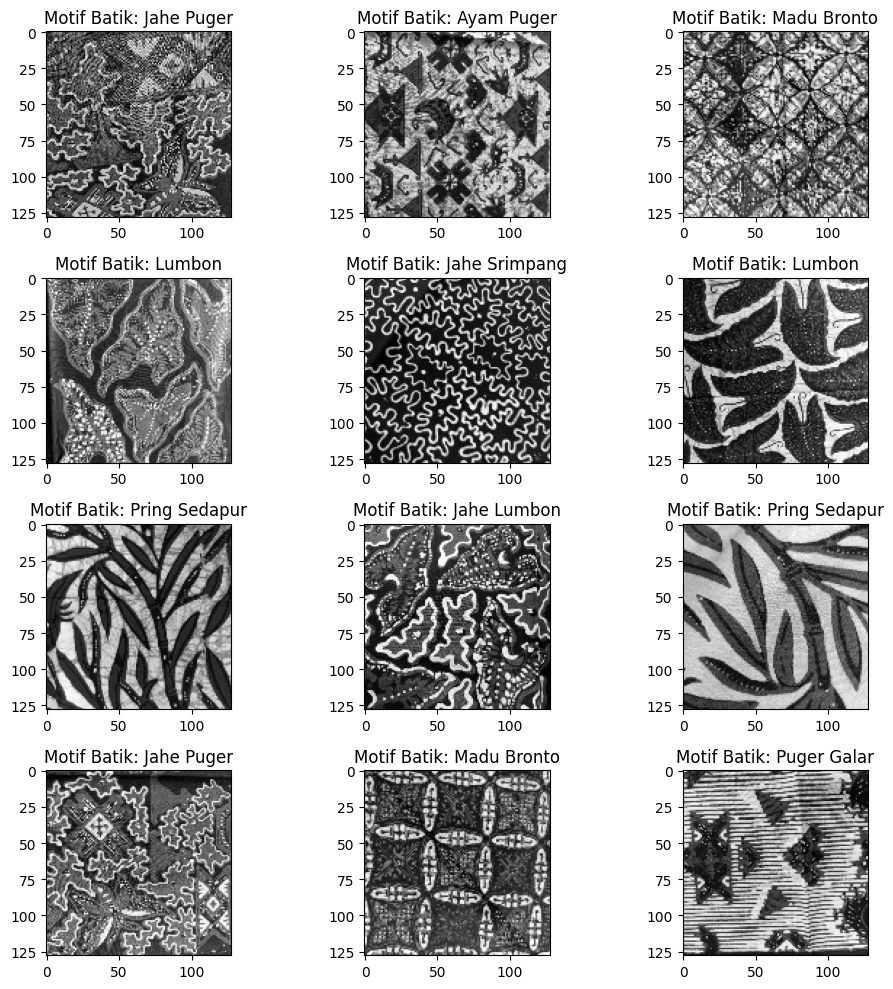

In [ ]:
fig, ax = plt.subplots(4, 3)
fig.set_size_inches(10, 10)

for i in range(4):
    for j in range(3): 
        l = random.randint(0, len(G)) 
        ax[i, j].imshow(C[l], cmap='gray')
        ax[i, j].set_title('Motif Batik: ' + G[l])

plt.tight_layout()

### **Canny Edge Detection**

In [ ]:
X = [] 
Z = [] 
IMG_SIZE = 128 

def assign_label(img, batik_type):
    return batik_type

# converts an array representing edges into a monochrome colour image with colours resulting from the edge intensities
def convert_to_color(edges):
    colored_edges = np.zeros((edges.shape[0], edges.shape[1], 3), dtype=np.uint8)
    colored_edges[:,:,0] = edges # sets the edges value to the red colour channel (R)
    colored_edges[:,:,1] = edges # sets the edges value to the green colour channel (G)
    colored_edges[:,:,2] = edges # sets the edges value to the blue colour channel (B)
    return colored_edges

def make_dataset(batik_type, DIR):
    for img in tqdm(os.listdir(DIR)):
        if fnmatch.fnmatch(img, '*.jpg'):
            label = assign_label(img, batik_type)
            path = os.path.join(DIR, img)
            img = cv2.imread(path)
            rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            resize = cv2.resize(rgb, (IMG_SIZE, IMG_SIZE))
            gray = cv2.cvtColor(resize, cv2.COLOR_RGB2GRAY)
            blur = cv2.GaussianBlur(gray, (3,3), 0)
            edges = cv2.Canny(blur, 100, 200)
            X.append(convert_to_color(edges))
            Z.append(str(label))

make_dataset('Angguran', "Batik Banyumasan/Angguran")
make_dataset('Ayam Puger', "Batik Banyumasan/Ayam Puger")
make_dataset('Jahe Lumbon', "Batik Banyumasan/Jahe Lumbon")
make_dataset('Jahe Puger', "Batik Banyumasan/Jahe Puger")
make_dataset('Jahe Srimpang', "Batik Banyumasan/Jahe Srimpang")
make_dataset('Lumbon', "Batik Banyumasan/Lumbon")
make_dataset('Madu Bronto', "Batik Banyumasan/Madu Bronto")
make_dataset('Pring Sedapur', "Batik Banyumasan/Pring Sedapur")
make_dataset('Puger Galar', "Batik Banyumasan/Puger Galar")
make_dataset('Puger Telu Bal', "Batik Banyumasan/Puger Telu Bal")
make_dataset('Wit Lumbon', "Batik Banyumasan/Wit Lumbon")

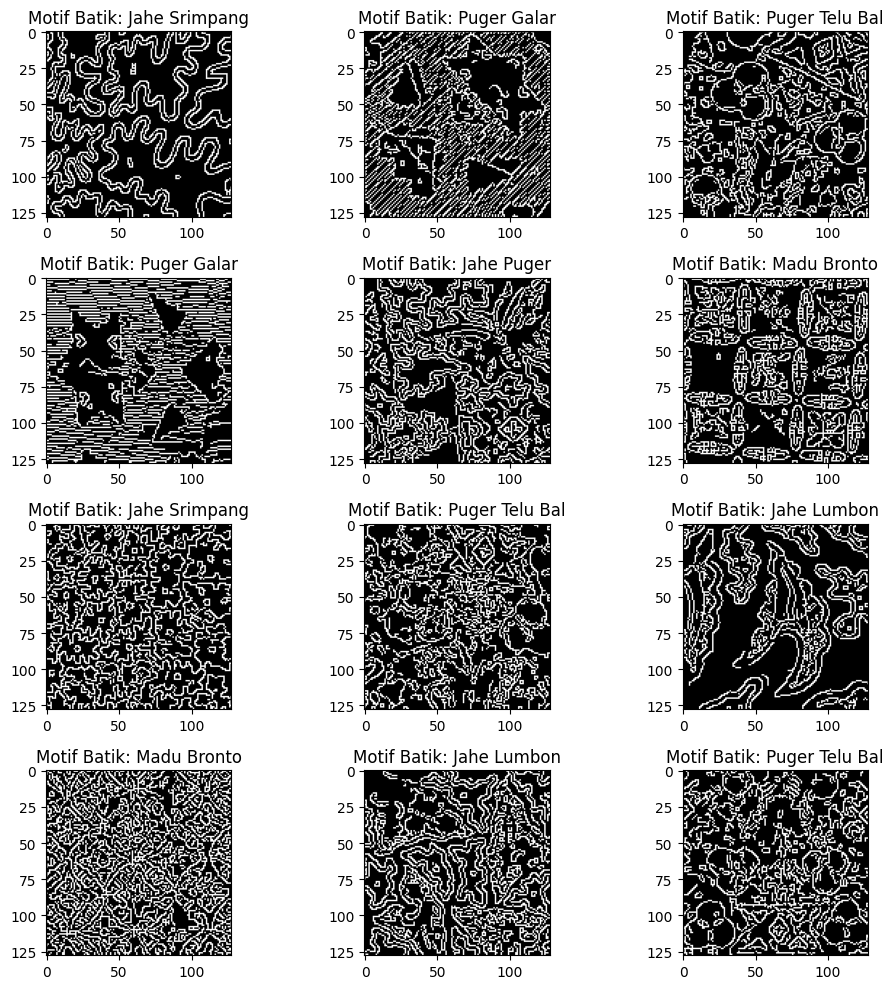

In [ ]:
fig, ax = plt.subplots(4, 3)
fig.set_size_inches(10, 10)

for i in range(4):
    for j in range(3): 
        l = random.randint(0, len(Z)) 
        ax[i, j].imshow(X[l])
        ax[i, j].set_title('Motif Batik: ' + Z[l])

plt.tight_layout()

## **Dataset Information**

In [ ]:
print('Jumlah Data yang Ada dalam Dataset: ',len(X),'\n')

# use set to remove duplicate labels, then convert back to list
set_Z = set(Z)
list_Z = (list(set_Z))

print('Jumlah Kelas yang Ada dalam Dataset: ',len(list_Z),"\n")

print('Kelasnya berupa:')
for item in list_Z:
    print(item)

Jumlah Data yang Ada dalam Dataset:  5148 

Jumlah Kelas yang Ada dalam Dataset:  11 

Kelasnya berupa:
Jahe Srimpang
Pring Sedapur
Angguran
Lumbon
Jahe Lumbon
Madu Bronto
Ayam Puger
Wit Lumbon
Jahe Puger
Puger Galar
Puger Telu Bal


## **Changes Category Labels and Normalization**

In [ ]:
label = LabelEncoder()

Y_fit = label.fit_transform(Z)

Y = to_categorical(Y_fit, 11)

X = np.array(X)
X = X/255

## **Split Dataset (Training, Validation, Testing)**

In [ ]:
x_train, x_remains, y_train, y_remains = train_test_split(X, Y, test_size=0.2, random_state=42, stratify=Y)

In [ ]:
x_val, x_test, y_val, y_test = train_test_split(x_remains, y_remains, test_size=0.5, random_state=42, stratify=y_remains)

In [ ]:
train_class_counts = np.sum(y_train, axis=0)
print("Jumlah sampel dalam setiap kelas (variabel train)")
print(train_class_counts)
print('Data Training:')
print('X: ',len(x_train))
print('Y: ',len(y_train),'\n')

val_class_counts = np.sum(y_val, axis=0)
print("Jumlah sampel dalam setiap kelas (variabel validation)")
print(val_class_counts)
print('Data Validation:')
print('X: ',len(x_val))
print('Y: ',len(y_val),'\n')

test_class_counts = np.sum(y_test, axis=0)
print("Jumlah sampel dalam setiap kelas (variabel test)")
print(test_class_counts)
print('Data Testing: ')
print('X: ',len(x_test))
print('Y: ',len(y_test))

# **Convolutional Neural Network (CNN)**

## **M1**

In [ ]:
m1 = Sequential()

m1.add(Conv2D(8, (3, 3), input_shape=(128, 128, 3), activation='relu'))
m1.add(MaxPooling2D(2, 2))
m1.add(Conv2D(16, (3, 3), activation='relu'))
m1.add(MaxPooling2D(2, 2))
m1.add(Conv2D(32, (3, 3), activation='relu'))
m1.add(MaxPooling2D(2, 2))
m1.add(Conv2D(64, (3, 3), activation='relu'))
m1.add(MaxPooling2D(2, 2))

m1.add(Flatten())

m1.add(Dense(128, activation='relu'))
m1.add(Dense(11, activation='softmax'))

m1.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

m1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 8)       224       
                                                                 
 max_pooling2d (MaxPooling2  (None, 63, 63, 8)         0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 16)        1168      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 30, 30, 16)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 28, 28, 32)        4640      
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 14, 14, 32)        0

In [ ]:
keras2ascii(m1)

           OPERATION           DATA DIMENSIONS   WEIGHTS(N)   WEIGHTS(%)

               Input   #####    128  128    3
              Conv2D    \|/  -------------------       224     0.1%
                relu   #####    126  126    8
        MaxPooling2D   Y max -------------------         0     0.0%
                       #####     63   63    8
              Conv2D    \|/  -------------------      1168     0.4%
                relu   #####     61   61   16
        MaxPooling2D   Y max -------------------         0     0.0%
                       #####     30   30   16
              Conv2D    \|/  -------------------      4640     1.4%
                relu   #####     28   28   32
        MaxPooling2D   Y max -------------------         0     0.0%
                       #####     14   14   32
              Conv2D    \|/  -------------------     18496     5.8%
                relu   #####     12   12   64
        MaxPooling2D   Y max -------------------         0     0.0%
              

### **Train M1**

In [ ]:
# callback to adjust the learning rate when performance does not improve above a threshold
lr_reducer_m1 = ReduceLROnPlateau(factor=0.5, patience=4, min_lr=0.000001)

history_m1 = m1.fit(x_train, y_train, validation_data=(x_val, y_val), batch_size=32, epochs=100, callbacks=[lr_reducer_m1])

print(history_m1.history.keys())

Epoch 1/100
129/129 [==============================] - 6s 18ms/step - loss: 1.9545 - accuracy: 0.2846 - val_loss: 1.4748 - val_accuracy: 0.4388 - lr: 0.0010
Epoch 2/100
129/129 [==============================] - 1s 10ms/step - loss: 1.2643 - accuracy: 0.5469 - val_loss: 1.1106 - val_accuracy: 0.6117 - lr: 0.0010
Epoch 3/100
129/129 [==============================] - 1s 10ms/step - loss: 0.8631 - accuracy: 0.6918 - val_loss: 0.9377 - val_accuracy: 0.6583 - lr: 0.0010
Epoch 4/100
129/129 [==============================] - 2s 17ms/step - loss: 0.5697 - accuracy: 0.8113 - val_loss: 0.5107 - val_accuracy: 0.8466 - lr: 0.0010
Epoch 5/100
129/129 [==============================] - 3s 21ms/step - loss: 0.3388 - accuracy: 0.8958 - val_loss: 0.4332 - val_accuracy: 0.8505 - lr: 0.0010
Epoch 6/100
129/129 [==============================] - 2s 12ms/step - loss: 0.2302 - accuracy: 0.9305 - val_loss: 0.3873 - val_accuracy: 0.8816 - lr: 0.0010
Epoch 7/100
129/129 [==============================] - 1s 

### **Visualization M1 Training**

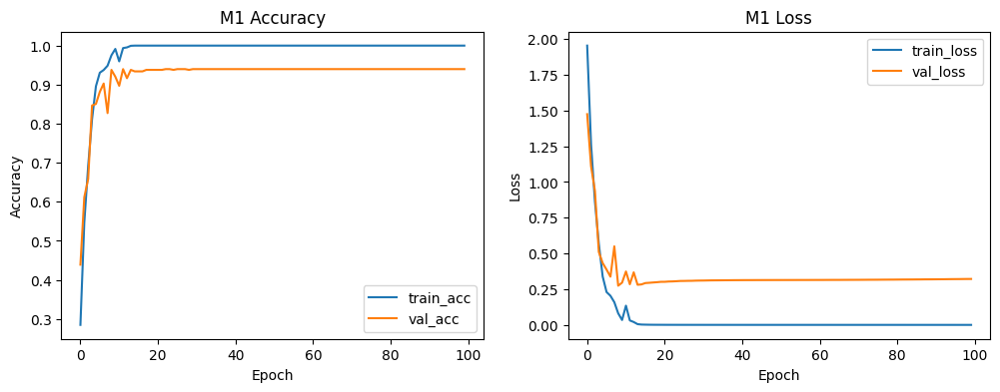

In [ ]:
plt.figure(figsize=(12,4))

plt.subplot(1,2,1) 
plt.plot(history_m1.history['accuracy']) 
plt.plot(history_m1.history['val_accuracy'])
plt.title('M1 Accuracy') 
plt.ylabel('Accuracy') 
plt.xlabel('Epoch') 
plt.legend(['train_acc', 'val_acc'], loc='lower right') 

plt.subplot(1,2,2) 
plt.plot(history_m1.history['loss']) 
plt.plot(history_m1.history['val_loss']) 
plt.title('M1 Loss') 
plt.ylabel('Loss') 
plt.xlabel('Epoch') 
plt.legend(['train_loss', 'val_loss'], loc='upper right') 

plt.show() 

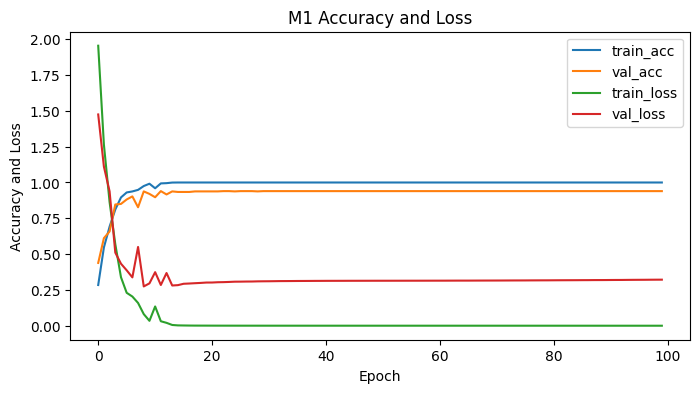

In [ ]:
plt.figure(figsize=(8,4)) 

plt.plot(history_m1.history['accuracy']) 
plt.plot(history_m1.history['val_accuracy']) 
plt.plot(history_m1.history['loss']) 
plt.plot(history_m1.history['val_loss']) 

plt.title('M1 Accuracy and Loss') 
plt.ylabel('Accuracy and Loss') 
plt.xlabel('Epoch') 
plt.legend(['train_acc', 'val_acc', 'train_loss', 'val_loss'], loc='upper right') 

plt.show() 

### **M1 Evaluation**

In [ ]:
y_predict_m1 = m1.predict(x_test)

y_predict_m1 = np.argmax(y_predict_m1, axis=1)

y_test_m1 = np.argmax(y_test, axis=1)

17/17 [==============================] - 0s 5ms/step


#### **Classification Report**

In [ ]:
print(classification_report(y_test_m1, y_predict_m1, target_names=label.classes_))

                precision    recall  f1-score   support

      Angguran       0.89      0.89      0.89        46
    Ayam Puger       0.91      0.91      0.91        47
   Jahe Lumbon       0.85      0.87      0.86        47
    Jahe Puger       0.94      0.96      0.95        47
 Jahe Srimpang       0.87      0.87      0.87        47
        Lumbon       0.89      0.89      0.89        46
   Madu Bronto       0.93      0.91      0.92        47
 Pring Sedapur       1.00      0.98      0.99        47
   Puger Galar       0.98      0.91      0.95        47
Puger Telu Bal       0.91      0.89      0.90        47
    Wit Lumbon       0.90      0.98      0.94        47

      accuracy                           0.92       515
     macro avg       0.92      0.92      0.92       515
  weighted avg       0.92      0.92      0.92       515



#### **Confusion Matrix**

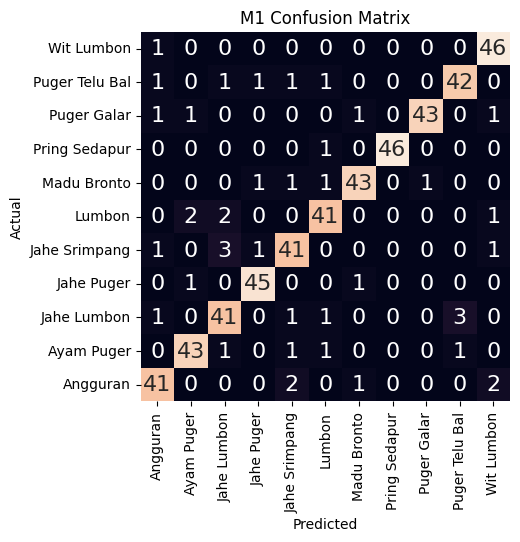

In [ ]:
cm = confusion_matrix(y_test_m1, y_predict_m1)

df = pd.DataFrame(cm, label.classes_, label.classes_)

ax = sns.heatmap(df,
                 annot=True, 
                 annot_kws={"size": 16}, 
                 square=True,
                 cbar=False, 
                 fmt='g' 
                 )

ax.set_ylim(0, 11)

plt.title('M1 Confusion Matrix') 

plt.xlabel("Predicted")
plt.ylabel("Actual")

plt.show()

### **Showing M1 Prediction Results**

In [ ]:
i = 0 
prop_class = [] 

for i in range(len(y_test_m1)): 
    if(np.argmax(y_test_m1[i])==y_predict_m1[i]): 
        prop_class.append(i) 
    if(len(prop_class)==8):  
        break


i = 0 
mis_class = [] 

for i in range(len(y_test_m1)): 
    if(not np.argmax(y_test_m1[i])==y_predict_m1[i]): 
        mis_class.append(i) 
    if(len(mis_class)==8): 
        break

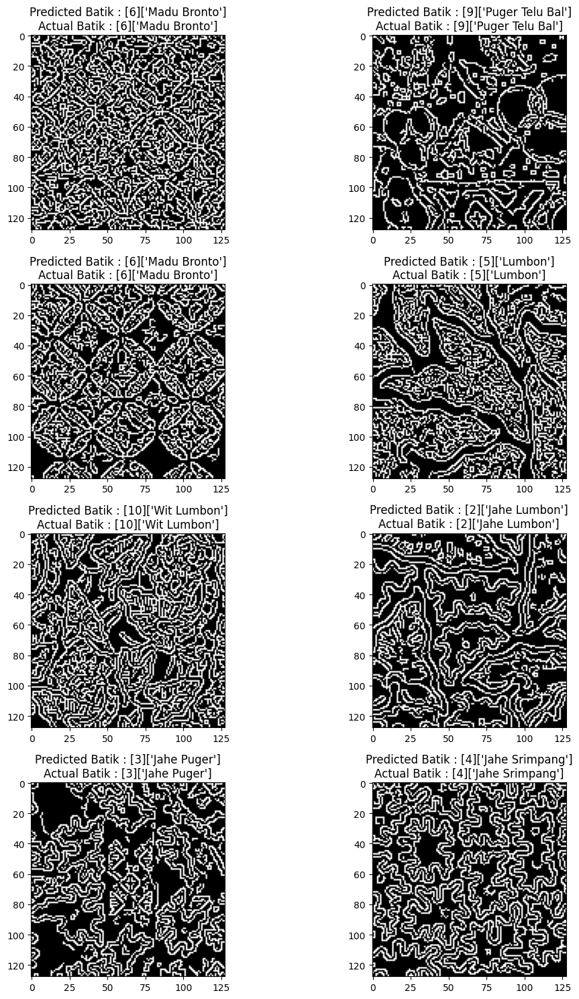

In [ ]:
count = 0 

fig,ax=plt.subplots(4,2)
fig.set_size_inches(15,15)

for i in range (4):
    for j in range (2):
        ax[i,j].imshow(x_test[mis_class[count]])
        ax[i,j].set_title("Predicted Batik : "
                          +str([y_predict_m1[mis_class[count]]])
                          +str(label.inverse_transform([y_predict_m1[mis_class[count]]]))
                          +"\n"+"Actual Batik : "
                          +str([y_test_m1[mis_class[count]]])
                          +str(label.inverse_transform([y_test_m1[mis_class[count]]])))
        plt.tight_layout()
        count += 1

### **Save M1**

In [ ]:
m1.save_weights('M1.h5')

## **M2**

In [ ]:
m2 = Sequential()

m2.add(Conv2D(8, (3, 3), input_shape=(128, 128, 3), padding='same', activation='relu'))
m2.add(MaxPooling2D(2, 2))
m2.add(Dropout(0.2))
m2.add(Conv2D(16, (3, 3), padding='same', activation='relu'))
m2.add(MaxPooling2D(2, 2))
m2.add(Dropout(0.2))
m2.add(Conv2D(32, (3, 3), padding='same', activation='relu'))
m2.add(MaxPooling2D(2, 2))
m2.add(Dropout(0.2))
m2.add(Conv2D(64, (3, 3), padding='same', activation='relu'))
m2.add(MaxPooling2D(2, 2))
m2.add(Dropout(0.2))

m2.add(Flatten())
m2.add(Dropout(0.5))

m2.add(Dense(128, activation='relu'))
m2.add(Dense(11, activation='softmax'))

m2.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

m2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 128, 128, 8)       224       
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 64, 64, 8)         0         
 g2D)                                                            
                                                                 
 dropout (Dropout)           (None, 64, 64, 8)         0         
                                                                 
 conv2d_5 (Conv2D)           (None, 64, 64, 16)        1168      
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 32, 32, 16)        0         
 g2D)                                                            
                                                                 
 dropout_1 (Dropout)         (None, 32, 32, 16)       

In [ ]:
keras2ascii(m2)

           OPERATION           DATA DIMENSIONS   WEIGHTS(N)   WEIGHTS(%)

               Input   #####    128  128    3
              Conv2D    \|/  -------------------       224     0.0%
                relu   #####    128  128    8
        MaxPooling2D   Y max -------------------         0     0.0%
                       #####     64   64    8
             Dropout    | || -------------------         0     0.0%
                       #####     64   64    8
              Conv2D    \|/  -------------------      1168     0.2%
                relu   #####     64   64   16
        MaxPooling2D   Y max -------------------         0     0.0%
                       #####     32   32   16
             Dropout    | || -------------------         0     0.0%
                       #####     32   32   16
              Conv2D    \|/  -------------------      4640     0.8%
                relu   #####     32   32   32
        MaxPooling2D   Y max -------------------         0     0.0%
              

### **Train M2**

In [ ]:
lr_reducer_m2 = ReduceLROnPlateau(factor=0.5, patience=4, min_lr=0.000001)

history_m2 = m2.fit(x_train, y_train, validation_data=(x_val, y_val), batch_size=32, epochs=100, callbacks=[lr_reducer_m2])

print(history_m2.history.keys())

Epoch 1/100
129/129 [==============================] - 7s 23ms/step - loss: 2.2647 - accuracy: 0.1593 - val_loss: 2.1911 - val_accuracy: 0.1379 - lr: 0.0010
Epoch 2/100
129/129 [==============================] - 2s 12ms/step - loss: 1.6721 - accuracy: 0.3953 - val_loss: 1.6429 - val_accuracy: 0.3981 - lr: 0.0010
Epoch 3/100
129/129 [==============================] - 2s 12ms/step - loss: 1.3254 - accuracy: 0.5316 - val_loss: 1.3845 - val_accuracy: 0.4990 - lr: 0.0010
Epoch 4/100
129/129 [==============================] - 2s 12ms/step - loss: 1.0353 - accuracy: 0.6396 - val_loss: 1.3229 - val_accuracy: 0.5282 - lr: 0.0010
Epoch 5/100
129/129 [==============================] - 2s 12ms/step - loss: 0.8593 - accuracy: 0.6996 - val_loss: 0.8975 - val_accuracy: 0.6913 - lr: 0.0010
Epoch 6/100
129/129 [==============================] - 2s 12ms/step - loss: 0.7317 - accuracy: 0.7525 - val_loss: 0.7823 - val_accuracy: 0.7631 - lr: 0.0010
Epoch 7/100
129/129 [==============================] - 2s 

### **Visualization M2 Training**

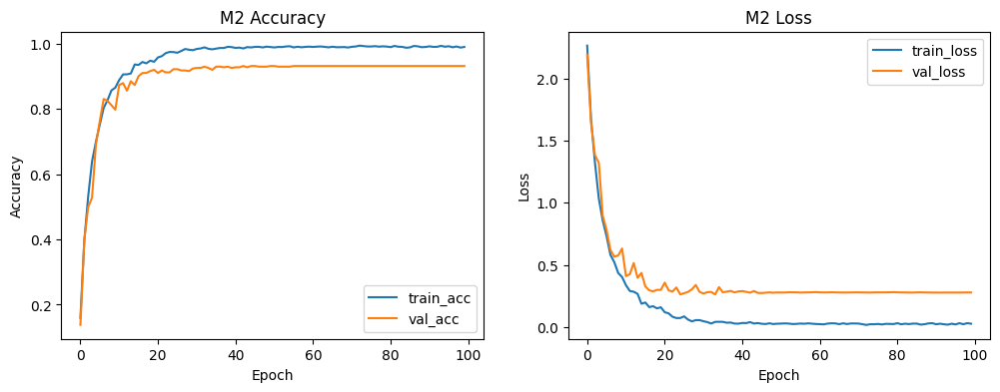

In [ ]:
plt.figure(figsize=(12,4)) 

plt.subplot(1,2,1) 
plt.plot(history_m2.history['accuracy']) 
plt.plot(history_m2.history['val_accuracy']) 
plt.title('M2 Accuracy') 
plt.ylabel('Accuracy') 
plt.xlabel('Epoch') 
plt.legend(['train_acc', 'val_acc'], loc='lower right')

plt.subplot(1,2,2) 
plt.plot(history_m2.history['loss']) 
plt.plot(history_m2.history['val_loss']) 
plt.title('M2 Loss') 
plt.ylabel('Loss') 
plt.xlabel('Epoch') 
plt.legend(['train_loss', 'val_loss'], loc='upper right') 

plt.show()

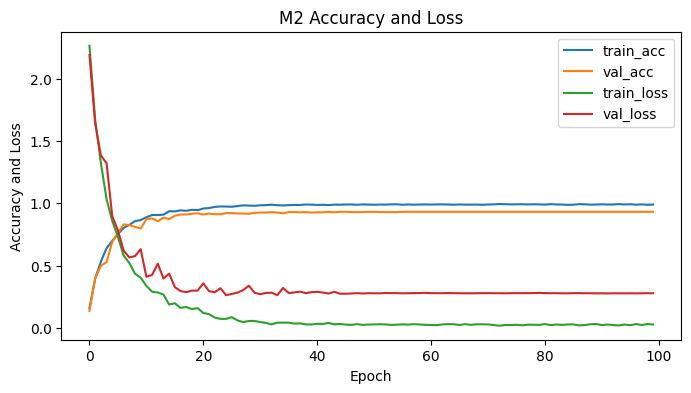

In [ ]:
plt.figure(figsize=(8,4))

plt.plot(history_m2.history['accuracy'])
plt.plot(history_m2.history['val_accuracy'])
plt.plot(history_m2.history['loss'])
plt.plot(history_m2.history['val_loss'])

plt.title('M2 Accuracy and Loss')
plt.ylabel('Accuracy and Loss')
plt.xlabel('Epoch')
plt.legend(['train_acc', 'val_acc', 'train_loss', 'val_loss'], loc='upper right')

plt.show()

### **M2 Evaluation**

In [ ]:
y_predict_m2 = m2.predict(x_test)

y_predict_m2 = np.argmax(y_predict_m2, axis=1)

y_test_m2 = np.argmax(y_test, axis=1)

17/17 [==============================] - 0s 5ms/step


#### **Classification Report**

In [ ]:
print(classification_report(y_test_m2, y_predict_m2, target_names=label.classes_))

                precision    recall  f1-score   support

      Angguran       0.96      0.93      0.95        46
    Ayam Puger       0.95      0.89      0.92        47
   Jahe Lumbon       0.98      0.87      0.92        47
    Jahe Puger       0.94      0.98      0.96        47
 Jahe Srimpang       0.93      0.89      0.91        47
        Lumbon       0.88      0.96      0.92        46
   Madu Bronto       0.92      0.96      0.94        47
 Pring Sedapur       1.00      0.98      0.99        47
   Puger Galar       0.94      0.96      0.95        47
Puger Telu Bal       0.90      0.91      0.91        47
    Wit Lumbon       0.94      0.98      0.96        47

      accuracy                           0.94       515
     macro avg       0.94      0.94      0.94       515
  weighted avg       0.94      0.94      0.94       515



#### **Confusion Matrix**

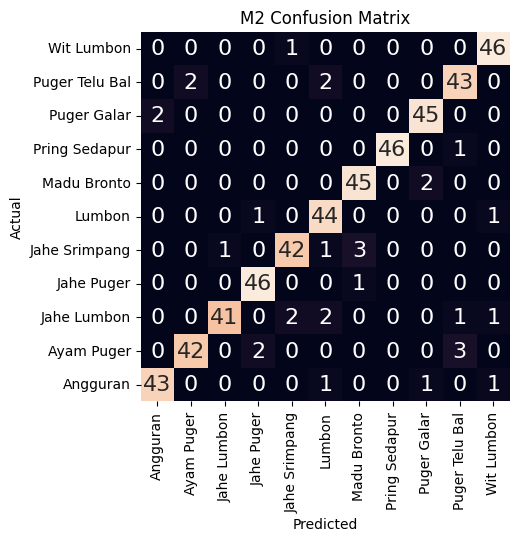

In [ ]:
cm = confusion_matrix(y_test_m2, y_predict_m2)
df = pd.DataFrame(cm, label.classes_, label.classes_)

ax = sns.heatmap(df, annot=True, annot_kws={"size": 16}, square=True, cbar=False, fmt='g')
ax.set_ylim(0, 11)

plt.title('M2 Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Actual")

plt.show()

### **Showing M2 Prediction Results**

In [ ]:
i = 0
prop_class = []

for i in range(len(y_test_m2)):
    if np.argmax(y_test_m2[i]) == y_predict_m2[i]:
        prop_class.append(i)
    if len(prop_class) == 8:
        break

i = 0
mis_class = []

for i in range(len(y_test_m2)):
    if np.argmax(y_test_m2[i]) != y_predict_m2[i]:
        mis_class.append(i)
    if len(mis_class) == 8:
        break

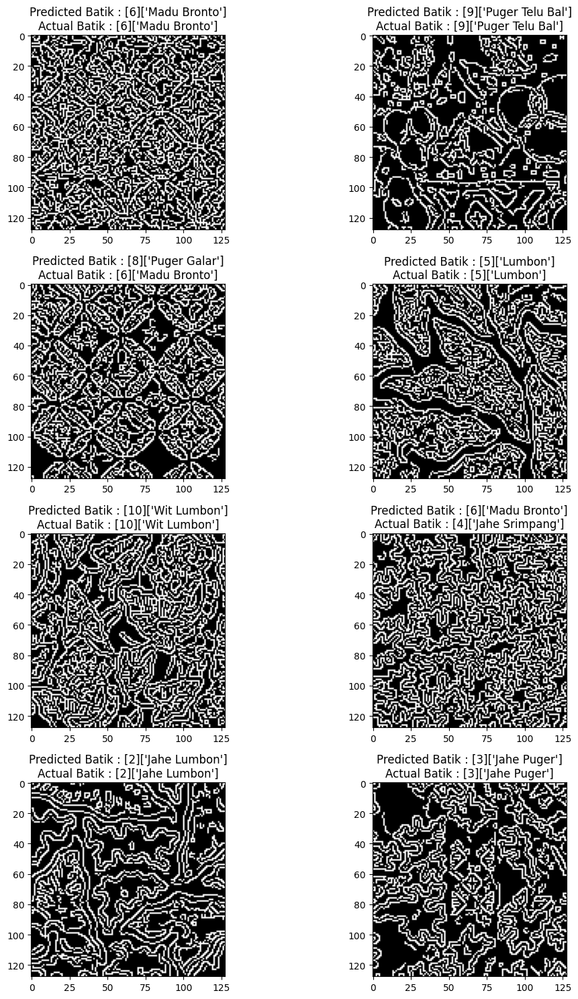

In [ ]:
count = 0

fig, ax = plt.subplots(4, 2)
fig.set_size_inches(15, 15)

for i in range(4):
    for j in range(2):
        ax[i, j].imshow(x_test[mis_class[count]])
        ax[i, j].set_title(
            "Predicted Batik: "
            + str([y_predict_m2[mis_class[count]]])
            + str(label.inverse_transform([y_predict_m2[mis_class[count]]]))
            + "\n"
            + "Actual Batik: "
            + str([y_test_m2[mis_class[count]]])
            + str(label.inverse_transform([y_test_m2[mis_class[count]]]))
        )
        plt.tight_layout()
        count += 1

### **Save M2**

In [ ]:
m2.save_weights('M2.h5')

## **M3**

In [ ]:
m3 = Sequential()

m3.add(Conv2D(24, (3, 3), input_shape=(128, 128, 3), activation='relu'))
m3.add(MaxPooling2D(2, 2))
m3.add(Conv2D(48, (3, 3), activation='relu'))
m3.add(MaxPooling2D(2, 2))
m3.add(Conv2D(96, (3, 3), activation='relu'))
m3.add(MaxPooling2D(2, 2))
m3.add(Conv2D(192, (3, 3), activation='relu'))
m3.add(MaxPooling2D(2, 2))

m3.add(Flatten())

m3.add(Dense(384, activation='relu'))
m3.add(Dense(11, activation='softmax'))

m3.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

m3.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 24)      672       
                                                                 
 max_pooling2d (MaxPooling2  (None, 63, 63, 24)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 48)        10416     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 30, 30, 48)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 28, 28, 96)        41568     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 14, 14, 96)        0

In [ ]:
keras2ascii(m3)

           OPERATION           DATA DIMENSIONS   WEIGHTS(N)   WEIGHTS(%)

               Input   #####    128  128    3
              Conv2D    \|/  -------------------       672     0.0%
                relu   #####    126  126   24
        MaxPooling2D   Y max -------------------         0     0.0%
                       #####     63   63   24
              Conv2D    \|/  -------------------     10416     0.4%
                relu   #####     61   61   48
        MaxPooling2D   Y max -------------------         0     0.0%
                       #####     30   30   48
              Conv2D    \|/  -------------------     41568     1.4%
                relu   #####     28   28   96
        MaxPooling2D   Y max -------------------         0     0.0%
                       #####     14   14   96
              Conv2D    \|/  -------------------    166080     5.8%
                relu   #####     12   12  192
        MaxPooling2D   Y max -------------------         0     0.0%
              

### **Train M3**

In [ ]:
lr_reducer_m3 = ReduceLROnPlateau(factor=0.5, patience=4, min_lr=0.000001)

history_m3 = m3.fit(x_train, y_train, validation_data=(x_val, y_val), batch_size=32, epochs=100, callbacks=[lr_reducer_m3])

print(history_m3.history.keys())

Epoch 1/100
129/129 [==============================] - 9s 27ms/step - loss: 1.8416 - accuracy: 0.3290 - val_loss: 1.4919 - val_accuracy: 0.4796 - lr: 0.0010
Epoch 2/100
129/129 [==============================] - 2s 17ms/step - loss: 1.0080 - accuracy: 0.6430 - val_loss: 0.9580 - val_accuracy: 0.6583 - lr: 0.0010
Epoch 3/100
129/129 [==============================] - 2s 17ms/step - loss: 0.6132 - accuracy: 0.8004 - val_loss: 0.8057 - val_accuracy: 0.7379 - lr: 0.0010
Epoch 4/100
129/129 [==============================] - 2s 17ms/step - loss: 0.3698 - accuracy: 0.8793 - val_loss: 0.5820 - val_accuracy: 0.8252 - lr: 0.0010
Epoch 5/100
129/129 [==============================] - 3s 20ms/step - loss: 0.1943 - accuracy: 0.9412 - val_loss: 0.4575 - val_accuracy: 0.9049 - lr: 0.0010
Epoch 6/100
129/129 [==============================] - 2s 19ms/step - loss: 0.1169 - accuracy: 0.9677 - val_loss: 0.4732 - val_accuracy: 0.8951 - lr: 0.0010
Epoch 7/100
129/129 [==============================] - 2s 

### **Visualization M3 Training**

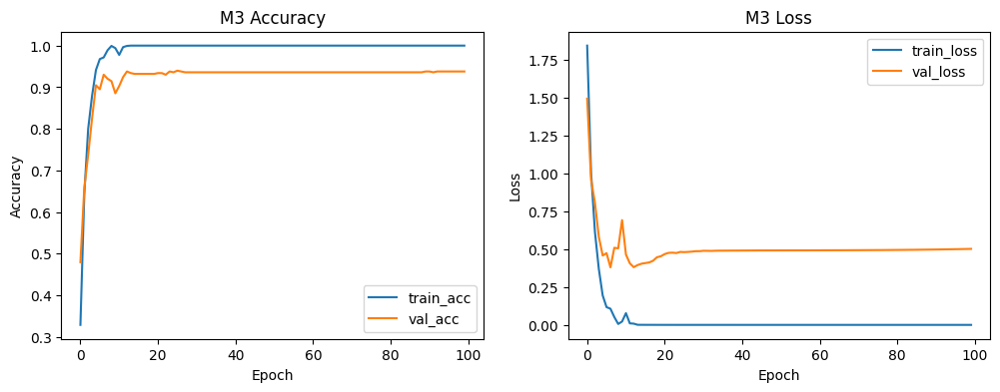

In [ ]:
plt.figure(figsize=(12,4))

plt.subplot(1,2,1)
plt.plot(history_m3.history['accuracy'])
plt.plot(history_m3.history['val_accuracy'])
plt.title('M3 Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['train_acc', 'val_acc'], loc='lower right')

plt.subplot(1,2,2)
plt.plot(history_m3.history['loss'])
plt.plot(history_m3.history['val_loss'])
plt.title('M3 Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train_loss', 'val_loss'], loc='upper right')

plt.show()

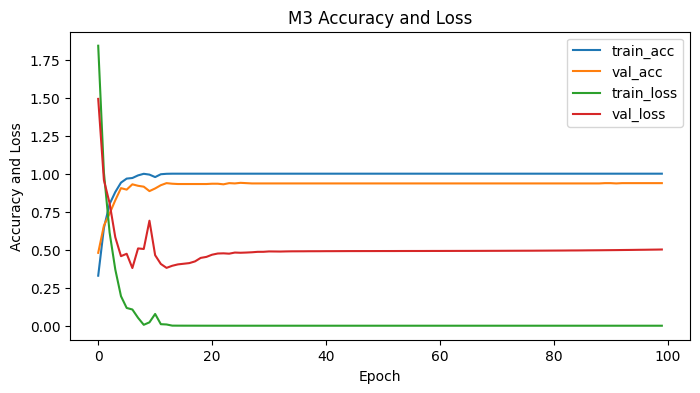

In [ ]:
plt.figure(figsize=(8,4))

plt.plot(history_m3.history['accuracy'])
plt.plot(history_m3.history['val_accuracy'])
plt.plot(history_m3.history['loss'])
plt.plot(history_m3.history['val_loss'])

plt.title('M3 Accuracy and Loss')
plt.ylabel('Accuracy and Loss')
plt.xlabel('Epoch')
plt.legend(['train_acc', 'val_acc', 'train_loss', 'val_loss'], loc='upper right')

plt.show()

### **M3 Evaluation**

In [ ]:
y_predict_m3 = m3.predict(x_test)

y_predict_m3 = np.argmax(y_predict_m3, axis=1)

y_test_m3 = np.argmax(y_test, axis=1)

17/17 [==============================] - 0s 10ms/step


#### **Classification Report**

In [ ]:
print(classification_report(y_test_m3, y_predict_m3, target_names=label.classes_))

                precision    recall  f1-score   support

      Angguran       0.93      0.87      0.90        46
    Ayam Puger       0.91      0.87      0.89        47
   Jahe Lumbon       0.90      0.96      0.93        47
    Jahe Puger       0.96      0.91      0.93        47
 Jahe Srimpang       0.91      0.91      0.91        47
        Lumbon       0.95      0.91      0.93        46
   Madu Bronto       0.90      0.96      0.93        47
 Pring Sedapur       0.98      1.00      0.99        47
   Puger Galar       1.00      0.89      0.94        47
Puger Telu Bal       0.92      0.94      0.93        47
    Wit Lumbon       0.87      0.98      0.92        47

      accuracy                           0.93       515
     macro avg       0.93      0.93      0.93       515
  weighted avg       0.93      0.93      0.93       515



#### **Confusion Matrix**

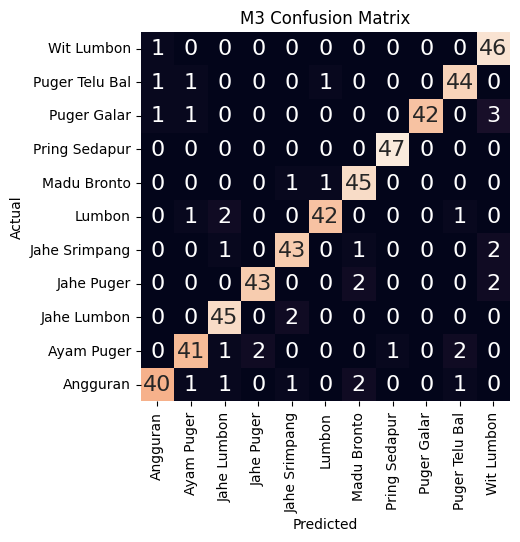

In [ ]:
cm = confusion_matrix(y_test_m3, y_predict_m3)
df = pd.DataFrame(cm, label.classes_, label.classes_)

ax = sns.heatmap(df, annot=True, annot_kws={"size": 16}, square=True, cbar=False, fmt='g')
ax.set_ylim(0, 11)

plt.title('M3 Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Actual")

plt.show()

### **Showing M3 Prediction Results**

In [ ]:
i = 0
prop_class = []

for i in range(len(y_test_m3)):
    if np.argmax(y_test_m3[i]) == y_predict_m3[i]:
        prop_class.append(i)
    if len(prop_class) == 8:
        break

i = 0
mis_class = []

for i in range(len(y_test_m3)):
    if np.argmax(y_test_m3[i]) != y_predict_m3[i]:
        mis_class.append(i)
    if len(mis_class) == 8:
        break

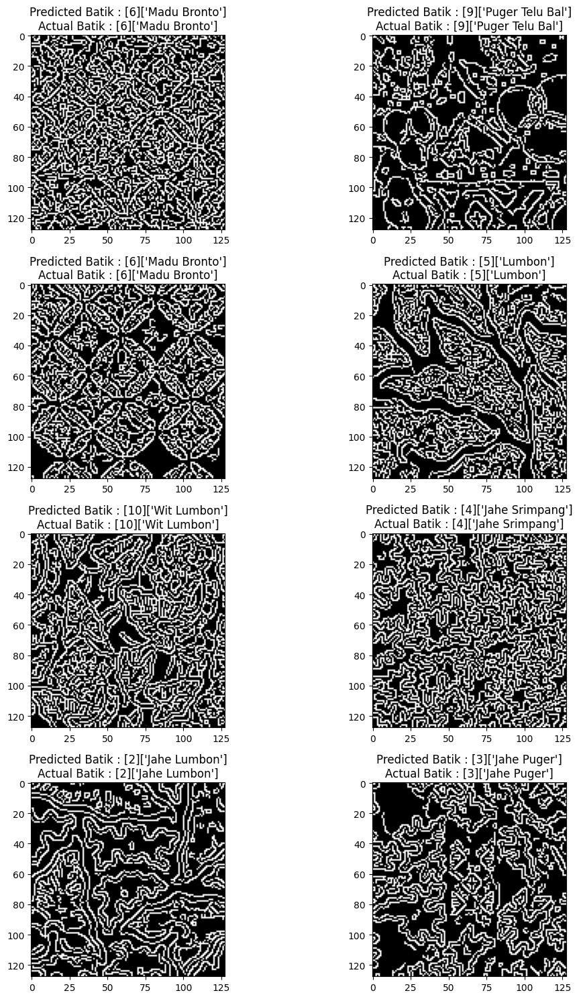

In [ ]:
count = 0

fig, ax = plt.subplots(4, 2)
fig.set_size_inches(15, 15)

for i in range(4):
    for j in range(2):
        ax[i, j].imshow(x_test[mis_class[count]])
        ax[i, j].set_title(
            "Predicted Batik: "
            + str([y_predict_m3[mis_class[count]]])
            + str(label.inverse_transform([y_predict_m3[mis_class[count]]]))
            + "\n"
            + "Actual Batik: "
            + str([y_test_m3[mis_class[count]]])
            + str(label.inverse_transform([y_test_m3[mis_class[count]]]))
        )
        plt.tight_layout()
        count += 1

### **Save M3**

In [ ]:
m3.save_weights('M3.h5')

## **M4**

In [ ]:
m4 = Sequential()

m4.add(Conv2D(24, (3, 3), input_shape=(128, 128, 3), padding='same', activation='relu'))
m4.add(MaxPooling2D(2, 2))
m4.add(Dropout(0.2))
m4.add(Conv2D(48, (3, 3), padding='same', activation='relu'))
m4.add(MaxPooling2D(2, 2))
m4.add(Dropout(0.2))
m4.add(Conv2D(96, (3, 3), padding='same', activation='relu'))
m4.add(MaxPooling2D(2, 2))
m4.add(Dropout(0.2))
m4.add(Conv2D(192, (3, 3), padding='same', activation='relu'))
m4.add(MaxPooling2D(2, 2))
m4.add(Dropout(0.2))

m4.add(Flatten())
m4.add(Dropout(0.5))

m4.add(Dense(384, activation='relu'))
m4.add(Dense(11, activation='softmax'))

m4.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

m4.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 128, 128, 24)      672       
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 64, 64, 24)        0         
 g2D)                                                            
                                                                 
 dropout (Dropout)           (None, 64, 64, 24)        0         
                                                                 
 conv2d_5 (Conv2D)           (None, 64, 64, 48)        10416     
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 32, 32, 48)        0         
 g2D)                                                            
                                                                 
 dropout_1 (Dropout)         (None, 32, 32, 48)       

In [ ]:
keras2ascii(m4)

           OPERATION           DATA DIMENSIONS   WEIGHTS(N)   WEIGHTS(%)

               Input   #####    128  128    3
              Conv2D    \|/  -------------------       672     0.0%
                relu   #####    128  128   24
        MaxPooling2D   Y max -------------------         0     0.0%
                       #####     64   64   24
             Dropout    | || -------------------         0     0.0%
                       #####     64   64   24
              Conv2D    \|/  -------------------     10416     0.2%
                relu   #####     64   64   48
        MaxPooling2D   Y max -------------------         0     0.0%
                       #####     32   32   48
             Dropout    | || -------------------         0     0.0%
                       #####     32   32   48
              Conv2D    \|/  -------------------     41568     0.8%
                relu   #####     32   32   96
        MaxPooling2D   Y max -------------------         0     0.0%
              

### **Train M4**

In [ ]:
lr_reducer_m4 = ReduceLROnPlateau(factor=0.5, patience=4, min_lr=0.000001)

history_m4 = m4.fit(x_train, y_train, validation_data=(x_val, y_val), batch_size=32, epochs=100, callbacks=[lr_reducer_m4])

print(history_m4.history.keys())

Epoch 1/100
129/129 [==============================] - 10s 34ms/step - loss: 2.1621 - accuracy: 0.2098 - val_loss: 1.8415 - val_accuracy: 0.3282 - lr: 0.0010
Epoch 2/100
129/129 [==============================] - 3s 25ms/step - loss: 1.5937 - accuracy: 0.4172 - val_loss: 1.9272 - val_accuracy: 0.3204 - lr: 0.0010
Epoch 3/100
129/129 [==============================] - 3s 24ms/step - loss: 1.2239 - accuracy: 0.5622 - val_loss: 1.1025 - val_accuracy: 0.6019 - lr: 0.0010
Epoch 4/100
129/129 [==============================] - 3s 23ms/step - loss: 0.9350 - accuracy: 0.6712 - val_loss: 1.0640 - val_accuracy: 0.6194 - lr: 0.0010
Epoch 5/100
129/129 [==============================] - 3s 24ms/step - loss: 0.7537 - accuracy: 0.7300 - val_loss: 0.6603 - val_accuracy: 0.8214 - lr: 0.0010
Epoch 6/100
129/129 [==============================] - 3s 26ms/step - loss: 0.5737 - accuracy: 0.8035 - val_loss: 0.4751 - val_accuracy: 0.8718 - lr: 0.0010
Epoch 7/100
129/129 [==============================] - 3s

### **Visualization M4 Training**

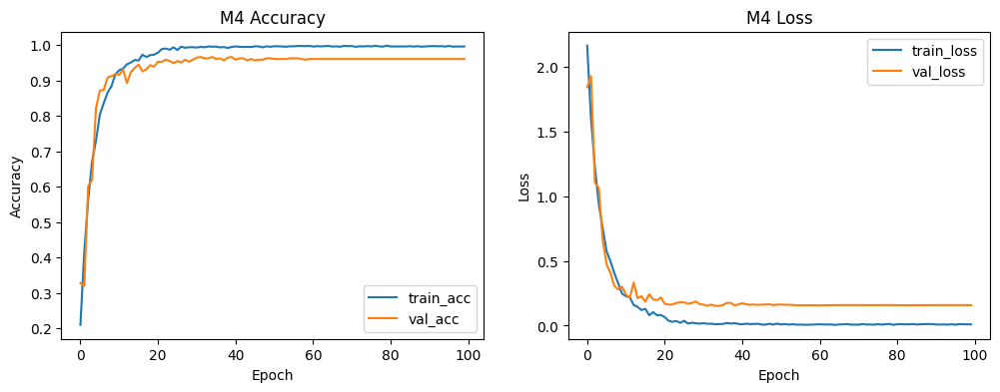

In [ ]:
plt.figure(figsize=(12,4))

plt.subplot(1,2,1)
plt.plot(history_m4.history['accuracy'])
plt.plot(history_m4.history['val_accuracy'])
plt.title('M4 Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['train_acc', 'val_acc'], loc='lower right')

plt.subplot(1,2,2)
plt.plot(history_m4.history['loss'])
plt.plot(history_m4.history['val_loss'])
plt.title('M4 Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train_loss', 'val_loss'], loc='upper right')

plt.show()

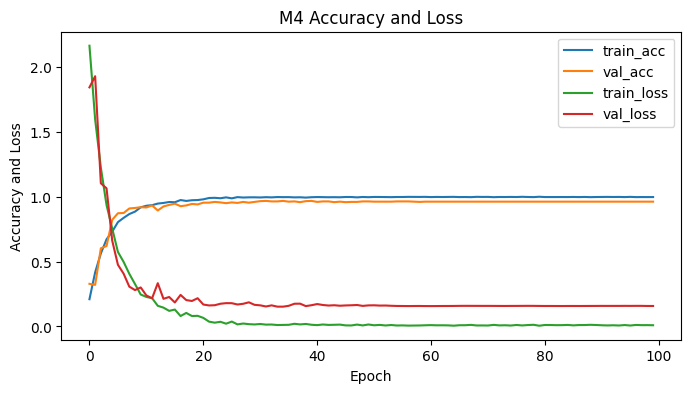

In [ ]:
plt.figure(figsize=(8,4))

plt.plot(history_m4.history['accuracy'])
plt.plot(history_m4.history['val_accuracy'])
plt.plot(history_m4.history['loss'])
plt.plot(history_m4.history['val_loss'])

plt.title('M4 Accuracy and Loss')
plt.ylabel('Accuracy and Loss')
plt.xlabel('Epoch')
plt.legend(['train_acc', 'val_acc', 'train_loss', 'val_loss'], loc='upper right')

plt.show()

### **M4 Evaluation**

In [ ]:
y_predict_m4 = m4.predict(x_test)

y_predict_m4 = np.argmax(y_predict_m4, axis=1)

y_test_m4 = np.argmax(y_test, axis=1)

17/17 [==============================] - 0s 8ms/step


#### **Classification Report**

In [ ]:
print(classification_report(y_test_m4, y_predict_m4, target_names=label.classes_))

                precision    recall  f1-score   support

      Angguran       0.98      0.93      0.96        46
    Ayam Puger       0.96      0.96      0.96        47
   Jahe Lumbon       0.94      0.98      0.96        47
    Jahe Puger       0.94      0.98      0.96        47
 Jahe Srimpang       0.96      0.94      0.95        47
        Lumbon       0.96      0.98      0.97        46
   Madu Bronto       0.98      0.94      0.96        47
 Pring Sedapur       1.00      1.00      1.00        47
   Puger Galar       0.98      0.94      0.96        47
Puger Telu Bal       0.94      0.96      0.95        47
    Wit Lumbon       0.98      1.00      0.99        47

      accuracy                           0.96       515
     macro avg       0.96      0.96      0.96       515
  weighted avg       0.96      0.96      0.96       515



#### **Confusion Matrix**

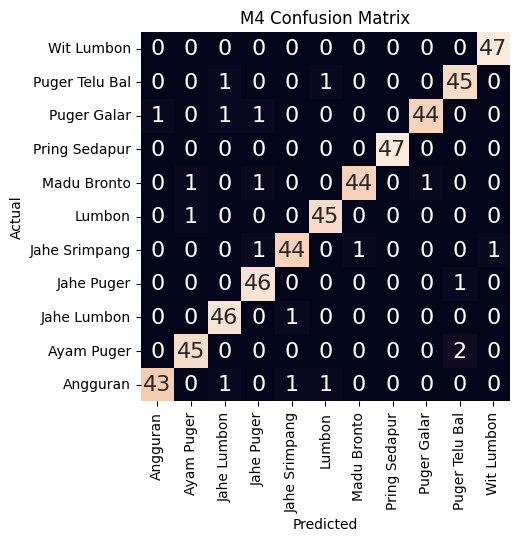

In [ ]:
cm = confusion_matrix(y_test_m4, y_predict_m4)
df = pd.DataFrame(cm, label.classes_, label.classes_)

ax = sns.heatmap(df, annot=True, annot_kws={"size": 16}, square=True, cbar=False, fmt='g')
ax.set_ylim(0, 11)

plt.title('M4 Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Actual")

plt.show()

### **Showing M4 Prediction Results**

In [ ]:
i = 0
prop_class = []

for i in range(len(y_test_m4)):
    if np.argmax(y_test_m4[i]) == y_predict_m4[i]:
        prop_class.append(i)
    if len(prop_class) == 8:
        break

i = 0
mis_class = []

for i in range(len(y_test_m4)):
    if np.argmax(y_test_m4[i]) != y_predict_m4[i]:
        mis_class.append(i)
    if len(mis_class) == 8:
        break

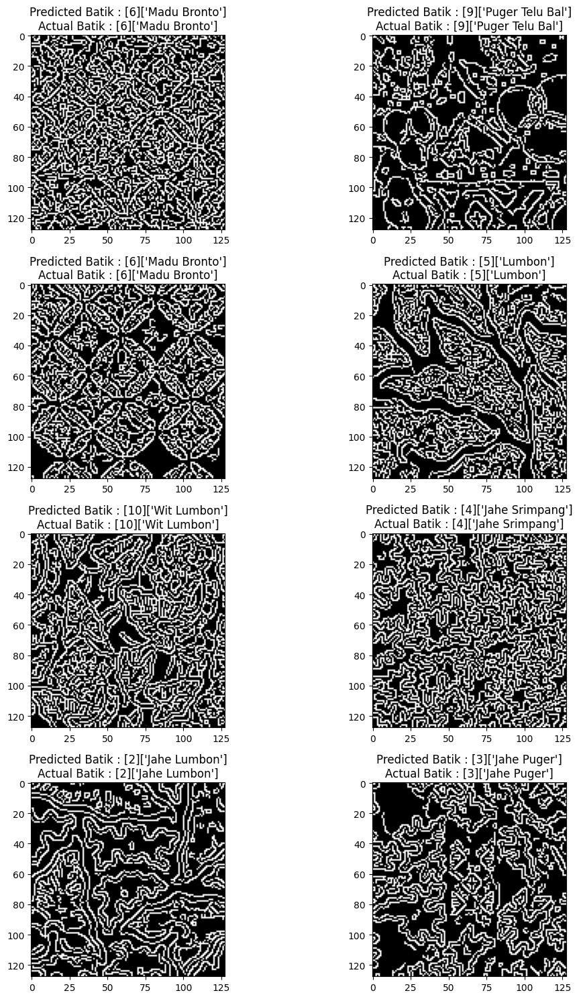

In [ ]:
count = 0

fig, ax = plt.subplots(4, 2)
fig.set_size_inches(15, 15)

for i in range(4):
    for j in range(2):
        ax[i, j].imshow(x_test[mis_class[count]])
        ax[i, j].set_title("Predicted Batik : "
                           + str([y_predict_m4[mis_class[count]]])
                           + str(label.inverse_transform([y_predict_m4[mis_class[count]]]))
                           + "\n" + "Actual Batik : "
                           + str([y_test_m4[mis_class[count]]])
                           + str(label.inverse_transform([y_test_m4[mis_class[count]]])))
        plt.tight_layout()
        count += 1

### **Save M4**

In [ ]:
m4.save_weights('M4.h5')

## **VGG16_1**

In [ ]:
VGG16_1 = VGG16(
    weights='imagenet',
    include_top=False,
    input_shape=(128,128,3)
    )

VGG16_1.trainable = False

58889256/58889256 [==============================] - 3s 0us/step


In [ ]:
f = Flatten()(VGG16_1.output)

d1 = Dense(128, activation='relu')(f)
d2 = Dense(11, activation='softmax')(d1)

model_vgg16_1 = Model(inputs=VGG16_1.input, outputs=d2)
model_vgg16_1.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

model_vgg16_1.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 128, 128, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 128, 128, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 64, 64, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 64, 64, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 64, 64, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 32, 32, 128)       0   

### **Train VGG16_1**

In [ ]:
lr_reducer_vgg16_1 = ReduceLROnPlateau(factor=0.5, patience=4, min_lr=0.000001)

history_model_vgg16_1 = model_vgg16_1.fit(x_train, y_train, validation_data=(x_val, y_val), batch_size=32, epochs=100, callbacks=[lr_reducer_vgg16_1])

print(history_model_vgg16_1.history.keys())

Epoch 1/100
129/129 [==============================] - 10s 58ms/step - loss: 0.6537 - accuracy: 0.8213 - val_loss: 0.2059 - val_accuracy: 0.9631 - lr: 0.0010
Epoch 2/100
129/129 [==============================] - 7s 54ms/step - loss: 0.1502 - accuracy: 0.9711 - val_loss: 0.1340 - val_accuracy: 0.9689 - lr: 0.0010
Epoch 3/100
129/129 [==============================] - 7s 54ms/step - loss: 0.0791 - accuracy: 0.9854 - val_loss: 0.1103 - val_accuracy: 0.9670 - lr: 0.0010
Epoch 4/100
129/129 [==============================] - 7s 55ms/step - loss: 0.0438 - accuracy: 0.9942 - val_loss: 0.0537 - val_accuracy: 0.9922 - lr: 0.0010
Epoch 5/100
129/129 [==============================] - 7s 56ms/step - loss: 0.0317 - accuracy: 0.9964 - val_loss: 0.0404 - val_accuracy: 0.9922 - lr: 0.0010
Epoch 6/100
129/129 [==============================] - 7s 51ms/step - loss: 0.0244 - accuracy: 0.9966 - val_loss: 0.0353 - val_accuracy: 0.9903 - lr: 0.0010
Epoch 7/100
129/129 [==============================] - 7s

### **Visualization VGG16_1 Training**

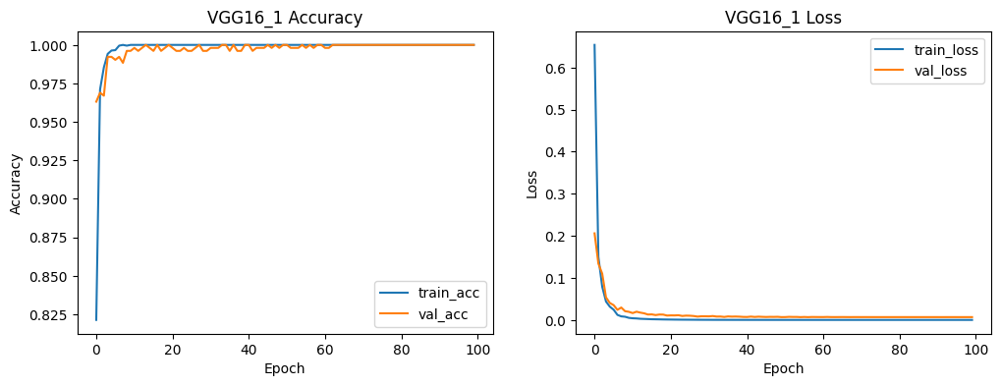

In [ ]:
plt.figure(figsize=(12,4))

plt.subplot(1,2,1)
plt.plot(history_model_vgg16_1.history['accuracy'])
plt.plot(history_model_vgg16_1.history['val_accuracy'])
plt.title('VGG16_1 Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['train_acc', 'val_acc'], loc='lower right')

plt.subplot(1,2,2)
plt.plot(history_model_vgg16_1.history['loss'])
plt.plot(history_model_vgg16_1.history['val_loss'])
plt.title('VGG16_1 Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train_loss', 'val_loss'], loc='upper right')

plt.show()

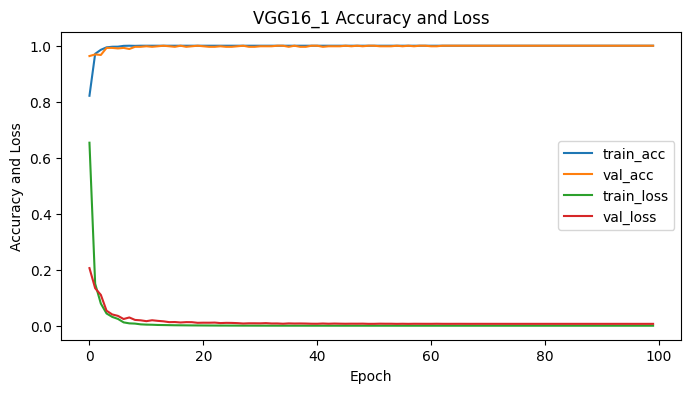

In [ ]:
plt.figure(figsize=(8,4))

plt.plot(history_model_vgg16_1.history['accuracy'])
plt.plot(history_model_vgg16_1.history['val_accuracy'])
plt.plot(history_model_vgg16_1.history['loss'])
plt.plot(history_model_vgg16_1.history['val_loss'])

plt.title('VGG16_1 Accuracy and Loss')
plt.ylabel('Accuracy and Loss')
plt.xlabel('Epoch')
plt.legend(['train_acc', 'val_acc', 'train_loss', 'val_loss'], loc='center right')

plt.show()

### **VGG16_1 Evaluation**

In [ ]:
y_predict_vgg16_1 = model_vgg16_1.predict(x_test)

y_predict_vgg16_1 = np.argmax(y_predict_vgg16_1, axis=1)

y_test_vgg16_1 = np.argmax(y_test, axis=1)

17/17 [==============================] - 1s 45ms/step


#### **Classification Report**

In [ ]:
print(classification_report(y_test_vgg16_1, y_predict_vgg16_1, target_names=label.classes_))

                precision    recall  f1-score   support

      Angguran       1.00      0.98      0.99        46
    Ayam Puger       0.96      0.98      0.97        47
   Jahe Lumbon       0.98      1.00      0.99        47
    Jahe Puger       1.00      0.98      0.99        47
 Jahe Srimpang       0.98      1.00      0.99        47
        Lumbon       1.00      1.00      1.00        46
   Madu Bronto       0.98      0.98      0.98        47
 Pring Sedapur       1.00      1.00      1.00        47
   Puger Galar       1.00      1.00      1.00        47
Puger Telu Bal       1.00      0.98      0.99        47
    Wit Lumbon       1.00      1.00      1.00        47

      accuracy                           0.99       515
     macro avg       0.99      0.99      0.99       515
  weighted avg       0.99      0.99      0.99       515



#### **Confusion Matrix**

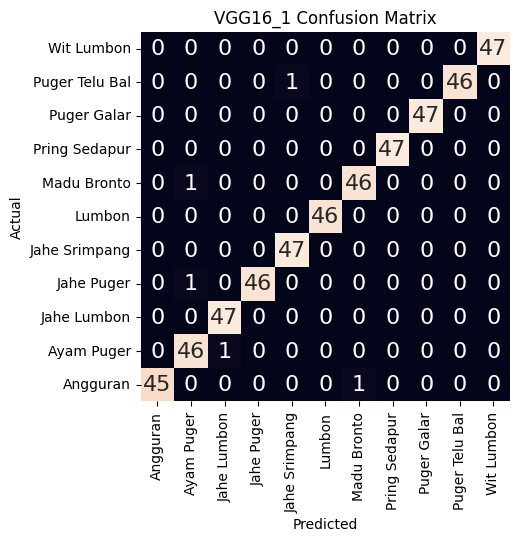

In [ ]:
cm = confusion_matrix(y_test_vgg16_1, y_predict_vgg16_1)
df = pd.DataFrame(cm, label.classes_, label.classes_)

ax = sns.heatmap(df, annot=True, annot_kws={"size": 16}, square=True, cbar=False, fmt='g')
ax.set_ylim(0, 11)

plt.title('VGG16_1 Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

### **Showing VGG16_1 Prediction Results**

In [ ]:
i = 0
prop_class = []

for i in range(len(y_test_vgg16_1)):
    if np.argmax(y_test_vgg16_1[i]) == y_predict_vgg16_1[i]:
        prop_class.append(i)
    if len(prop_class) == 8:
        break

i = 0
mis_class = []

for i in range(len(y_test_vgg16_1)):
    if np.argmax(y_test_vgg16_1[i]) != y_predict_vgg16_1[i]:
        mis_class.append(i)
    if len(mis_class) == 8:
        break

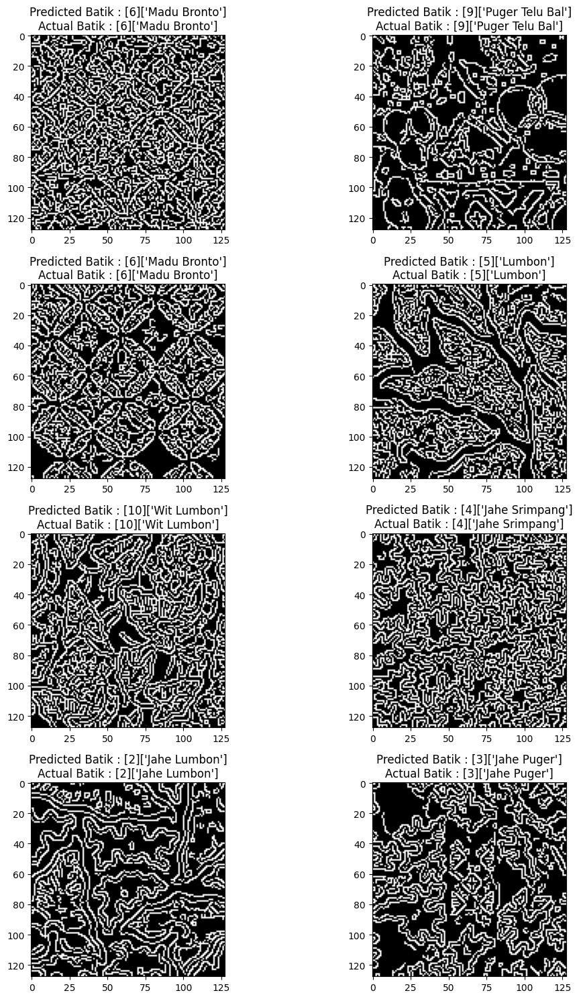

In [ ]:
count = 0
fig, ax = plt.subplots(4, 2)
fig.set_size_inches(15, 15)

for i in range(4):
    for j in range(2):
        ax[i, j].imshow(x_test[mis_class[count]])
        ax[i, j].set_title("Predicted Batik : "
                           + str([y_predict_vgg16_1[mis_class[count]]])
                           + str(label.inverse_transform([y_predict_vgg16_1[mis_class[count]]]))
                           + "\n" + "Actual Batik : "
                           + str([y_test_vgg16_1[mis_class[count]]])
                           + str(label.inverse_transform([y_test_vgg16_1[mis_class[count]]])))
        plt.tight_layout()
        count += 1

### **Save VGG16_1**

In [ ]:
model_vgg16_1.save_weights('VGG16_1.h5')

## **VGG16_2**

In [ ]:
VGG16_2 = VGG16(
    weights='imagenet',
    include_top=False,
    input_shape=(128,128,3)
    )

VGG16_2.trainable = False

In [ ]:
f = Flatten()(VGG16_2.output)

d1 = Dense(384, activation='relu')(f)
d2 = Dense(11, activation='softmax')(d1)

model_vgg16_2 = Model(inputs=VGG16_2.input, outputs=d2)
model_vgg16_2.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

model_vgg16_2.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 128, 128, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 128, 128, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 64, 64, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 64, 64, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 64, 64, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 32, 32, 128)       0     

### **Train VGG16_2**

In [ ]:
lr_reducer_vgg16_2 = ReduceLROnPlateau(factor=0.5, patience=4, min_lr=0.000001)

history_model_vgg16_2 = model_vgg16_2.fit(x_train, y_train, validation_data=(x_val, y_val), batch_size=32, epochs=100, callbacks=[lr_reducer_vgg16_2])

print(history_model_vgg16_2.history.keys())

Epoch 1/100
129/129 [==============================] - 15s 85ms/step - loss: 0.6876 - accuracy: 0.8031 - val_loss: 0.1759 - val_accuracy: 0.9689 - lr: 0.0010
Epoch 2/100
129/129 [==============================] - 7s 55ms/step - loss: 0.1281 - accuracy: 0.9709 - val_loss: 0.1011 - val_accuracy: 0.9806 - lr: 0.0010
Epoch 3/100
129/129 [==============================] - 6s 50ms/step - loss: 0.0607 - accuracy: 0.9886 - val_loss: 0.0743 - val_accuracy: 0.9767 - lr: 0.0010
Epoch 4/100
129/129 [==============================] - 7s 52ms/step - loss: 0.0396 - accuracy: 0.9932 - val_loss: 0.0391 - val_accuracy: 0.9922 - lr: 0.0010
Epoch 5/100
129/129 [==============================] - 7s 56ms/step - loss: 0.0229 - accuracy: 0.9961 - val_loss: 0.0436 - val_accuracy: 0.9942 - lr: 0.0010
Epoch 6/100
129/129 [==============================] - 7s 56ms/step - loss: 0.0166 - accuracy: 0.9981 - val_loss: 0.0414 - val_accuracy: 0.9864 - lr: 0.0010
Epoch 7/100
129/129 [==============================] - 6s

### **Visualization VGG16_2 Training**

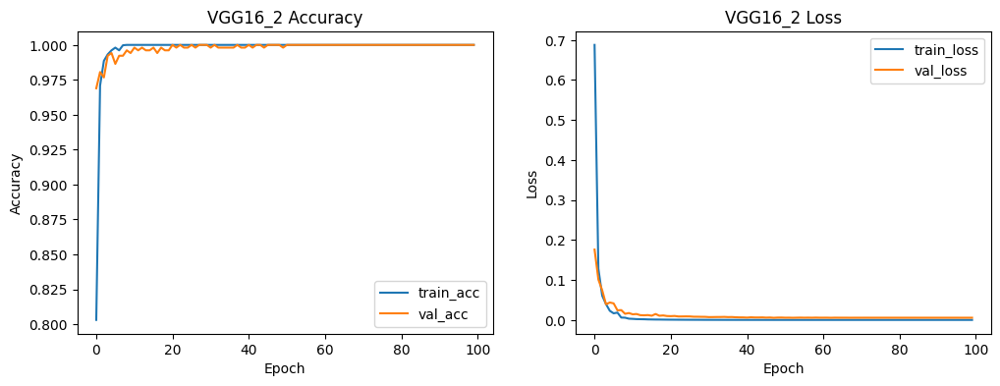

In [ ]:
plt.figure(figsize=(12,4))

plt.subplot(1,2,1)
plt.plot(history_model_vgg16_2.history['accuracy'])
plt.plot(history_model_vgg16_2.history['val_accuracy'])
plt.title('VGG16_2 Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['train_acc', 'val_acc'], loc='lower right')

plt.subplot(1,2,2)
plt.plot(history_model_vgg16_2.history['loss'])
plt.plot(history_model_vgg16_2.history['val_loss'])
plt.title('VGG16_2 Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train_loss', 'val_loss'], loc='upper right')

plt.show()

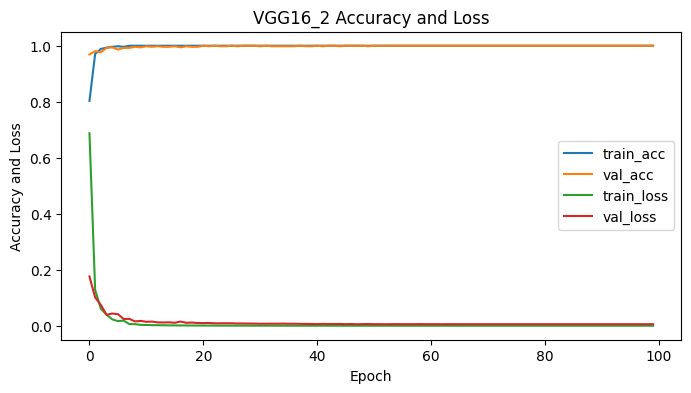

In [ ]:
plt.figure(figsize=(8,4))

plt.plot(history_model_vgg16_2.history['accuracy'])
plt.plot(history_model_vgg16_2.history['val_accuracy'])
plt.plot(history_model_vgg16_2.history['loss'])
plt.plot(history_model_vgg16_2.history['val_loss'])

plt.title('VGG16_2 Accuracy and Loss')
plt.ylabel('Accuracy and Loss')
plt.xlabel('Epoch')
plt.legend(['train_acc', 'val_acc', 'train_loss', 'val_loss'], loc='center right')

plt.show()

### **VGG16_2 Evaluation**

In [ ]:
y_predict_vgg16_2 = model_vgg16_2.predict(x_test)

y_predict_vgg16_2 = np.argmax(y_predict_vgg16_2, axis=1)

y_test_vgg16_2 = np.argmax(y_test, axis=1)

17/17 [==============================] - 1s 45ms/step


#### **Classification Report**

In [ ]:
print(classification_report(y_test_vgg16_2, y_predict_vgg16_2, target_names=label.classes_))

                precision    recall  f1-score   support

      Angguran       1.00      0.98      0.99        46
    Ayam Puger       0.96      0.98      0.97        47
   Jahe Lumbon       0.98      1.00      0.99        47
    Jahe Puger       1.00      0.98      0.99        47
 Jahe Srimpang       0.98      1.00      0.99        47
        Lumbon       1.00      1.00      1.00        46
   Madu Bronto       0.98      0.98      0.98        47
 Pring Sedapur       1.00      1.00      1.00        47
   Puger Galar       1.00      1.00      1.00        47
Puger Telu Bal       1.00      0.98      0.99        47
    Wit Lumbon       1.00      1.00      1.00        47

      accuracy                           0.99       515
     macro avg       0.99      0.99      0.99       515
  weighted avg       0.99      0.99      0.99       515



#### **Confusion Matrix**

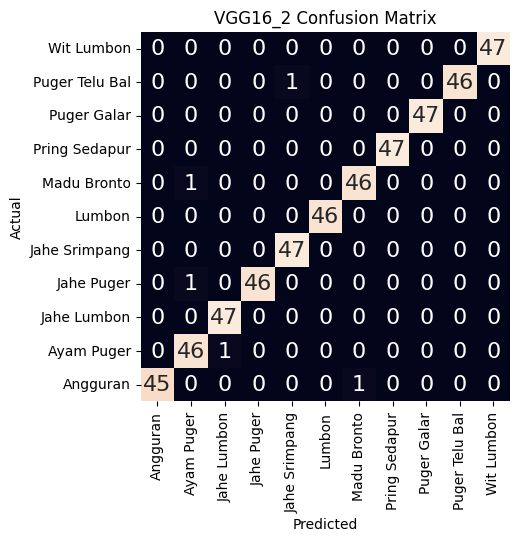

In [ ]:
cm = confusion_matrix(y_test_vgg16_2, y_predict_vgg16_2)
df = pd.DataFrame(cm, label.classes_, label.classes_)

ax = sns.heatmap(df, annot=True, annot_kws={"size": 16}, square=True, cbar=False, fmt='g')
ax.set_ylim(0, 11)

plt.title('VGG16_2 Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Actual")

plt.show()

### **Showing VGG16_2 Prediction Results**

In [ ]:
i = 0
prop_class = []

for i in range(len(y_test_vgg16_2)):
    if np.argmax(y_test_vgg16_2[i]) == y_predict_vgg16_2[i]:
        prop_class.append(i)
    if len(prop_class) == 8:
        break

i = 0
mis_class = []

for i in range(len(y_test_vgg16_2)):
    if np.argmax(y_test_vgg16_2[i]) != y_predict_vgg16_2[i]:
        mis_class.append(i)
    if len(mis_class) == 8:
        break

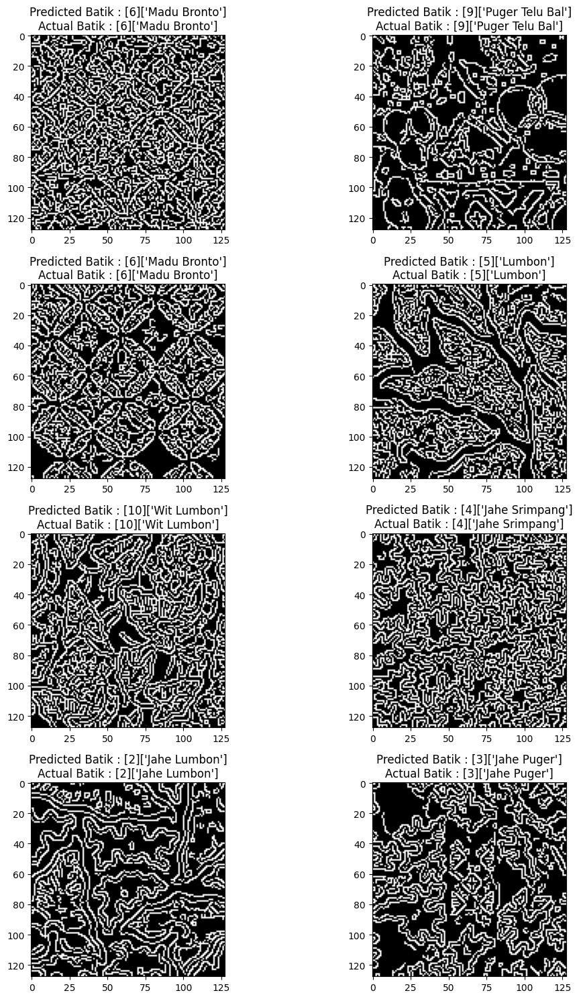

In [ ]:
count = 0

fig, ax = plt.subplots(4, 2)
fig.set_size_inches(15, 15)

for i in range(4):
    for j in range(2):
        ax[i, j].imshow(x_test[mis_class[count]])
        ax[i, j].set_title(
            "Predicted Batik: "
            + str([y_predict_vgg16_2[mis_class[count]]])
            + str(label.inverse_transform([y_predict_vgg16_2[mis_class[count]]]))
            + "\n"
            + "Actual Batik: "
            + str([y_test_vgg16_2[mis_class[count]]])
            + str(label.inverse_transform([y_test_vgg16_2[mis_class[count]]]))
        )
        plt.tight_layout()
        count += 1

### **Save VGG16_2**

In [ ]:
model_vgg16_2.save_weights('VGG16_2.h5')

# **Test using Random (Real) Data**

In [ ]:
m4 = Sequential()

m4.add(Conv2D(24, (3, 3), input_shape=(128, 128, 3), padding='same', activation='relu'))
m4.add(MaxPooling2D(2, 2))
m4.add(Dropout(0.2))
m4.add(Conv2D(48, (3, 3), padding='same', activation='relu'))
m4.add(MaxPooling2D(2, 2))
m4.add(Dropout(0.2))
m4.add(Conv2D(96, (3, 3), padding='same', activation='relu'))
m4.add(MaxPooling2D(2, 2))
m4.add(Dropout(0.2))
m4.add(Conv2D(192, (3, 3), padding='same', activation='relu'))
m4.add(MaxPooling2D(2, 2))
m4.add(Dropout(0.2))

m4.add(Flatten())
m4.add(Dropout(0.5))

m4.add(Dense(384, activation='relu'))
m4.add(Dense(11, activation='softmax'))

m4.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
m4.load_weights("M4.h5")

In [ ]:
VGG16_2 = VGG16(
    weights='imagenet',
    include_top=False,
    input_shape=(128,128,3)
    )

VGG16_2.trainable = False


f = Flatten()(VGG16_2.output)

d1 = Dense(384, activation='relu')(f)
d2 = Dense(11, activation='softmax')(d1)

model_vgg16_2 = Model(inputs=VGG16_2.input, outputs=d2)
model_vgg16_2.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
model_vgg16_2.load_weights("VGG16_2.h5")

In [ ]:
X = []
IMG_SIZE = 128

def convert_to_color(edges):
    colored_edges = np.zeros((edges.shape[0], edges.shape[1], 3), dtype=np.uint8)
    colored_edges[:,:,0] = edges
    colored_edges[:,:,1] = edges
    colored_edges[:,:,2] = edges
    return colored_edges

def make_dataset(DIR):
    for img in tqdm(os.listdir(DIR)):
        if fnmatch.fnmatch(img, '*.jpg'):
            path = os.path.join(DIR, img)
            img = cv2.imread(path)
            rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            resize = cv2.resize(rgb, (IMG_SIZE, IMG_SIZE))
            gray = cv2.cvtColor(resize, cv2.COLOR_RGB2GRAY)
            blur = cv2.GaussianBlur(gray, (3,3), 0)
            edges = cv2.Canny(blur, 100, 200)

            X.append(convert_to_color(edges))

make_dataset("Image Test (Download)")

1/1 [==============================] - 2s 2s/step


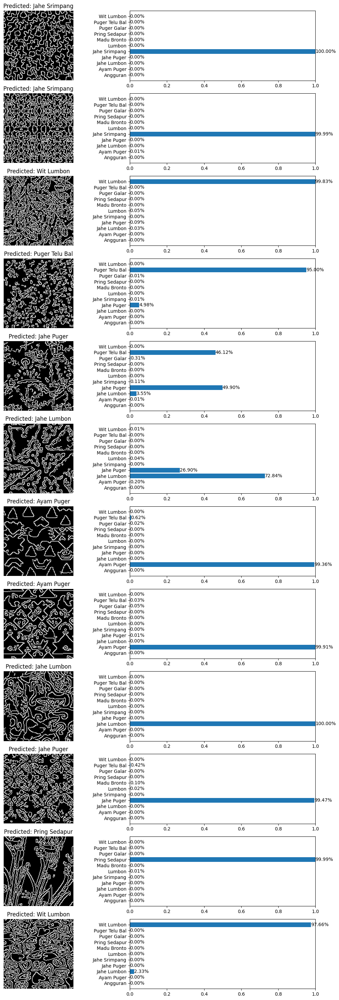

In [ ]:
label = {0: "Angguran", 1: "Ayam Puger", 2: "Jahe Lumbon", 3: "Jahe Puger", 4: "Jahe Srimpang", 5: "Lumbon",
         6: "Madu Bronto", 7: "Pring Sedapur", 8: "Puger Galar", 9: "Puger Telu Bal", 10: 'Wit Lumbon'}

xx = np.asarray(X)
test_X = xx / 255

pred_probs = model_vgg16_2.predict(test_X)
pred_classes = np.argmax(pred_probs, axis=1)

def plot_images_with_predictions(images, predictions, probabilities):
    num_images = len(images)
    fig, axs = plt.subplots(num_images, 2, figsize=(12, num_images*2.5))

    if num_images == 1:
        axs = [axs]

    for i in range(num_images):
        axs[i][0].imshow(images[i])
        axs[i][0].set_title(f"Predicted: {label[predictions[i]]}")
        axs[i][0].axis('off')

        bars = axs[i][1].barh(range(len(label)), probabilities[i])
        axs[i][1].set_yticks(range(len(label)))
        axs[i][1].set_yticklabels([label[j] for j in range(len(label))])
        axs[i][1].set_xlim(0, 1)

        for bar in bars:
            width = bar.get_width()
            axs[i][1].text(width, bar.get_y() + bar.get_height() / 2, f'{width:.2%}', ha='left', va='center')

    plt.tight_layout()
    plt.show()

plot_images_with_predictions(X, pred_classes, pred_probs)